In [149]:
# Importo las bibliotecas de OpenCV, Numpy y Matplotlib
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Parte 1

## Funciones

In [2]:
# Funcion para pasar imagen a coordenadas cromaticas
def img2coordCromatica(img):
    imgCromatica = np.zeros((img.shape[0], img.shape[1], 3), np.uint8)
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            # Obtengo los valores de los canales
            B = img[i,j,0].astype(np.float64)
            G = img[i,j,1].astype(np.float64)
            R = img[i,j,2].astype(np.float64)
            # print(R,G,B)
            # Calculo los valores de las coordenadas cromaticas
            X = R/(R+G+B) if R != 0 else 0
            Y = G/(R+G+B) if G != 0 else 0
            Z = B/(R+G+B) if B != 0 else 0
            # print(X,Y,Z)
            # Guardo los valores en la imagen de salida
            imgCromatica[i,j,0] = X*255
            imgCromatica[i,j,1] = Y*255
            imgCromatica[i,j,2] = Z*255
    return imgCromatica


In [173]:
# funcion para pasar imagen a withe-patch
def img2whitePatch(img):
    imgWhitePatch = np.zeros((img.shape[0], img.shape[1], 3), np.uint8)
    # Obtengo el valor maximo de los canales
    maxB = np.max(img[:,:,0])
    maxG = np.max(img[:,:,1])
    maxR = np.max(img[:,:,2])
    print(f'Img-Bmax:{maxB} Img-Gmax:{maxG} Img-Rmax:{maxR}')
    # aplico la formula a cada canal
    imgWhitePatch[:,:,0] = (img[:,:,0]*(255/maxB)).astype(np.uint8)
    imgWhitePatch[:,:,1] = (img[:,:,1]*(255/maxG)).astype(np.uint8)
    imgWhitePatch[:,:,2] = (img[:,:,2]*(255/maxR)).astype(np.uint8)
    print(f'WP-Bmax:{np.max(imgWhitePatch[:,:,0])} WP-Gmax:{np.max(imgWhitePatch[:,:,1])} WP-Rmax:{np.max(imgWhitePatch[:,:,2])}')
    return imgWhitePatch

# funcion para pasar imagen a withe-patch con percentil
def img2whitePatchPercentil(img):
    imgWhitePatch = np.zeros((img.shape[0], img.shape[1], 3), np.uint8)
    mascaraMaximo = np.zeros((img.shape[0], img.shape[1]), np.uint8)
    mascaraMaximo[:,:] = 255
    maxB = np.max(img[:,:,0])
    maxG = np.max(img[:,:,1])
    maxR = np.max(img[:,:,2])
    print(f'Img-Bmax:{maxB} Img-Gmax:{maxG} Img-Rmax:{maxR}')
    # Obtengo el valor percentil 90 de los canales
    perB = np.percentile(img[:,:,0], 90) 
    perG = np.percentile(img[:,:,1], 90)
    perR = np.percentile(img[:,:,2], 90)
    print(f'Img-Bper:{perB} Img-Gper:{perG} Img-Rper:{perR}')

    # si el valor maximo es 255 utilizo el percentil
    maxBAjustado = perB if maxB == 255 else maxB
    maxGAjustado = perG if maxG == 255 else maxG
    maxRAjustado = perR if maxR == 255 else maxR
    print(f'Img-maxBAjustado:{maxBAjustado} Img-maxGAjustado:{maxGAjustado} Img-maxRAjustado:{maxRAjustado}')
    # calculo el factor de escala para cada canal y protejo contra division por 0 
    escaladoB = 255/maxBAjustado if maxBAjustado != 0 else 1
    escaladoG = 255/maxGAjustado if maxGAjustado != 0 else 1
    escaladoR = 255/maxRAjustado if maxRAjustado != 0 else 1

    # aplico la formula a cada canal y ajusto el valor maximo a 1
    imgWhitePatch[:,:,0] = ( np.minimum(img[:,:,0]*escaladoB, mascaraMaximo ) ).astype(np.uint8)
    imgWhitePatch[:,:,1] = ( np.minimum(img[:,:,1]*escaladoG, mascaraMaximo ) ).astype(np.uint8)
    imgWhitePatch[:,:,2] = ( np.minimum(img[:,:,2]*escaladoR, mascaraMaximo ) ).astype(np.uint8)
    print(f'WP-Bmax:{np.max(imgWhitePatch[:,:,0])} WP-Gmax:{np.max(imgWhitePatch[:,:,1])} WP-Rmax:{np.max(imgWhitePatch[:,:,2])}')
    return imgWhitePatch

In [4]:
# funcion para hacer el histograma de una imagen BGR por canal
def histograma(img):
    color = ('b','g','r')

    for i,col in enumerate(color):
        histr = cv2.calcHist([img],[i],None,[256],[0,256])
        plt.plot(histr,color = color[i])
        plt.xlim([0,256])

    # plt.show()

## Coordenadas cromaticas

In [16]:
# lista de imagenes a procesar en coordenadas cromaticas
imgListCoordCromatica = ['coord_cromaticas/CoordCrom_1.png','coord_cromaticas/CoordCrom_2.png','coord_cromaticas/CoordCrom_3.png']

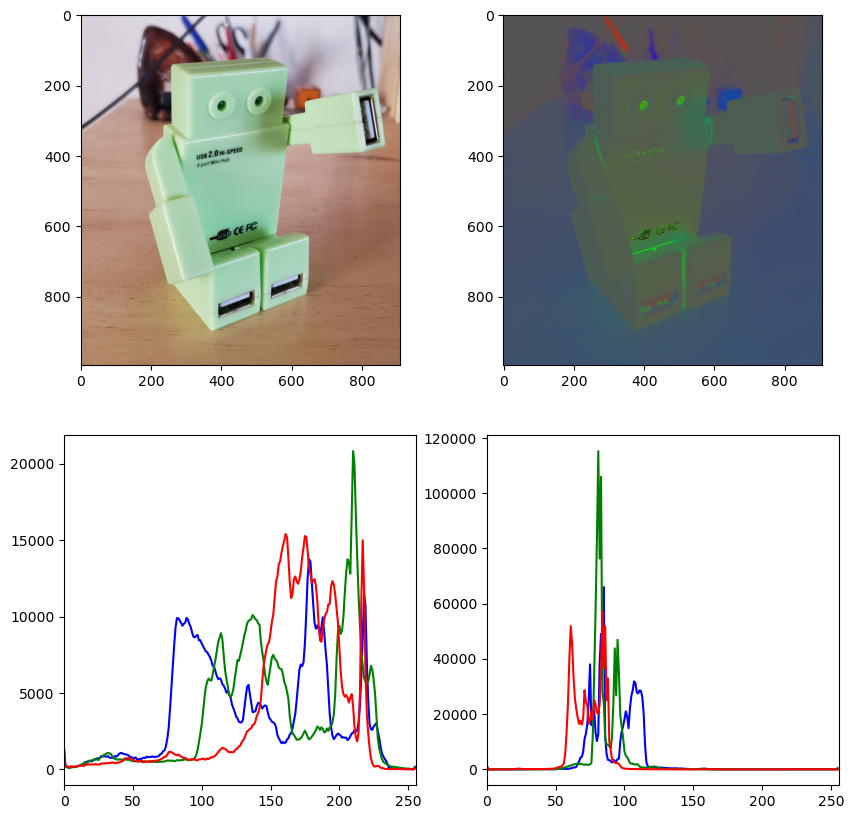

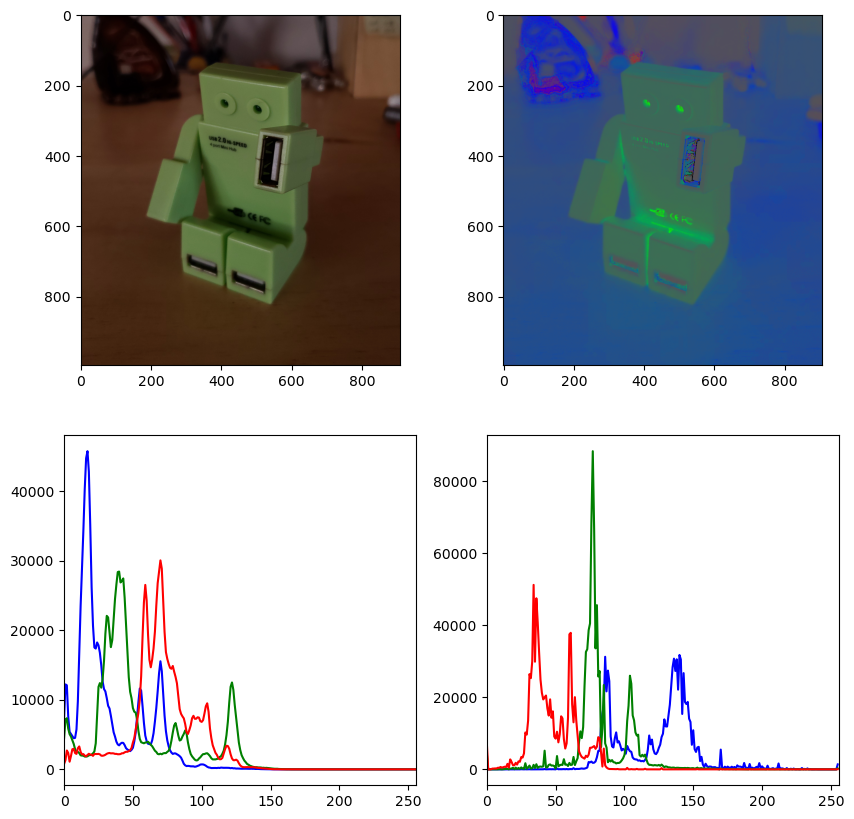

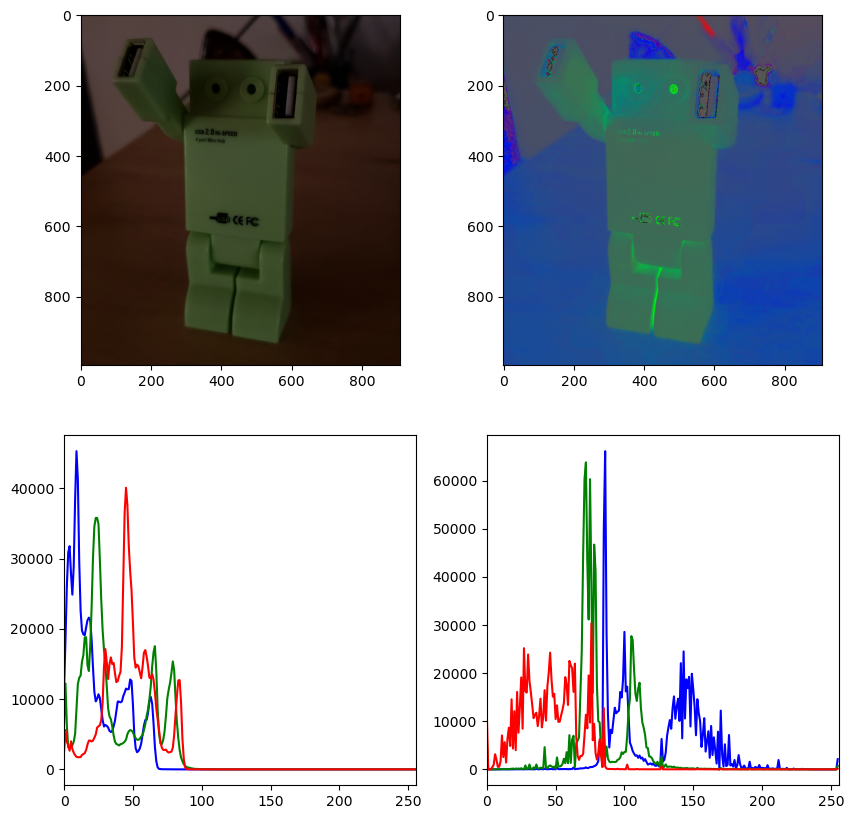

In [17]:
# recorro la lista de imagenes
for imgName in imgListCoordCromatica:
    # cargo la imagen
    img = cv2.imread(imgName)
    # convierto la imagen a coordenadas cromaticas
    imgCromatica = img2coordCromatica(img)
    # se muestra la imagen original y la imagen en coordenadas cromaticas con plt una al lado de la otra
    plt.figure(figsize=(10,10))
    plt.subplot(2,2,1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.subplot(2,2,2)
    plt.imshow(cv2.cvtColor(imgCromatica, cv2.COLOR_BGR2RGB))
    # se muestran los histogramas de la imagen original y la imagen en coordenadas cromaticas
    plt.subplot(2,2,3)
    histograma(img)
    plt.subplot(2,2,4)
    histograma(imgCromatica)
    plt.show()

Se observa que el color verde del muñeco en los 3 casos se desplaza a un rango de valores acotados que facilita su identificación y uso para realizar una máscara de segmentación.

## White-Patch

In [151]:
# lista de imagenes a procesar en white-patch
imgListWhitePatch = ['./white_patch/test_blue.png',
                     './white_patch/test_green.png',
                     './white_patch/test_red.png',
                     './white_patch/wp_blue.jpg',
                     './white_patch/wp_green.png',
                     './white_patch/wp_green2.jpg',
                     './white_patch/wp_red.png',
                     './white_patch/wp_red2.jpg']

./white_patch/test_blue.png
Img-Bmax:200 Img-Gmax:138 Img-Rmax:165
WP-Bmax:254 WP-Gmax:255 WP-Rmax:255


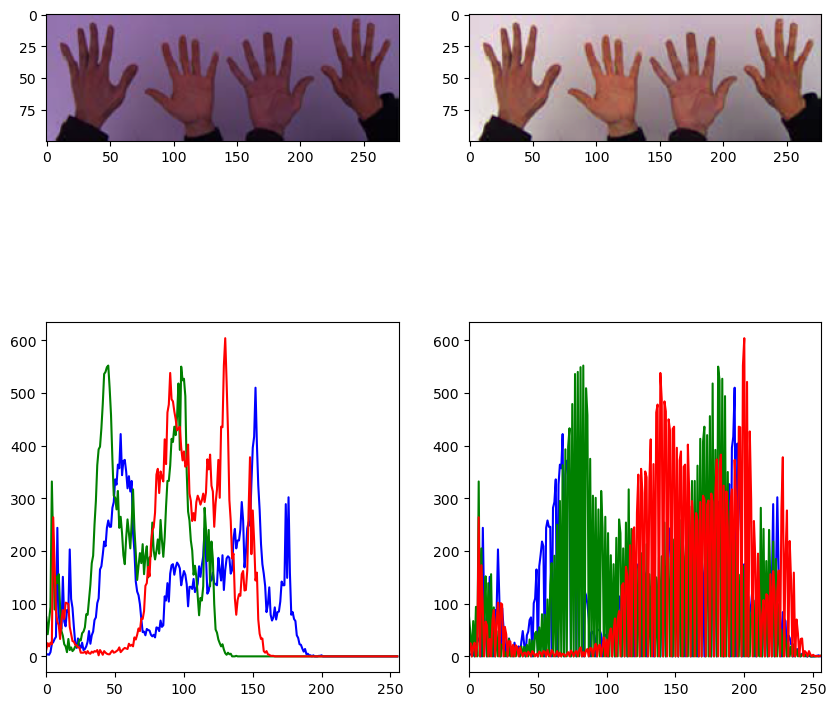

./white_patch/test_green.png
Img-Bmax:171 Img-Gmax:250 Img-Rmax:210
WP-Bmax:255 WP-Gmax:255 WP-Rmax:254


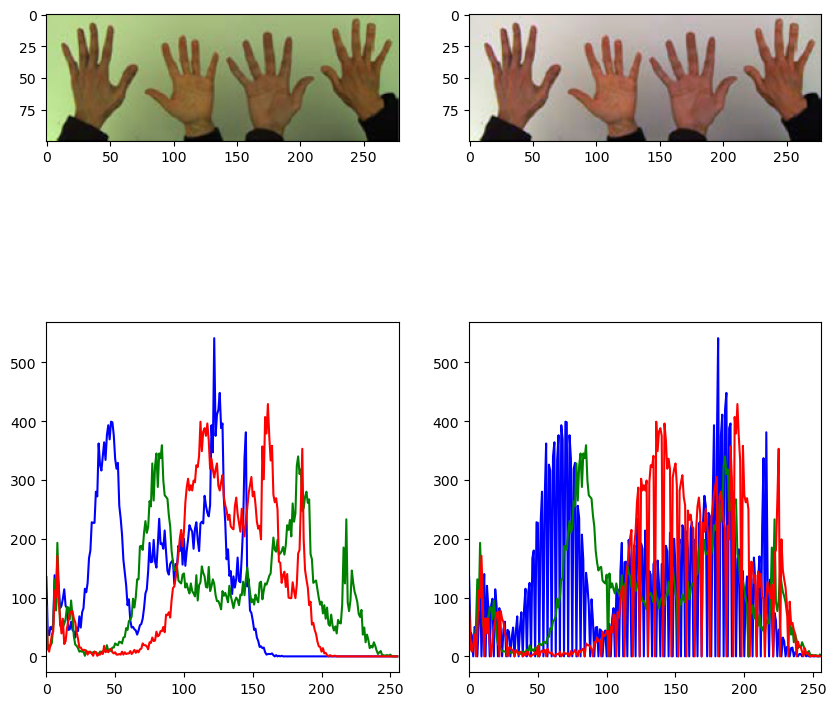

./white_patch/test_red.png
Img-Bmax:175 Img-Gmax:157 Img-Rmax:247
WP-Bmax:255 WP-Gmax:255 WP-Rmax:255


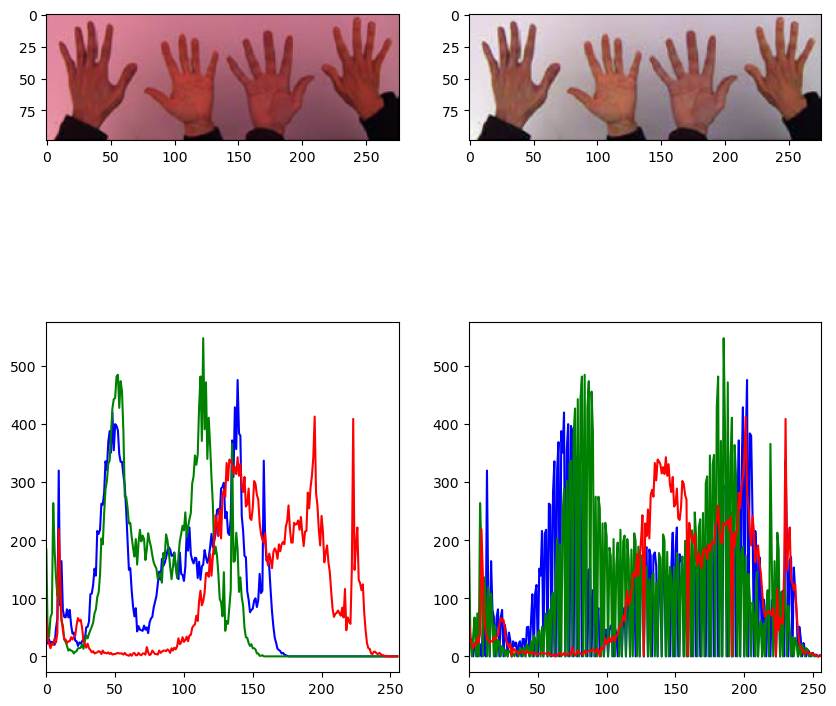

./white_patch/wp_blue.jpg
Img-Bmax:255 Img-Gmax:255 Img-Rmax:255
WP-Bmax:255 WP-Gmax:255 WP-Rmax:255


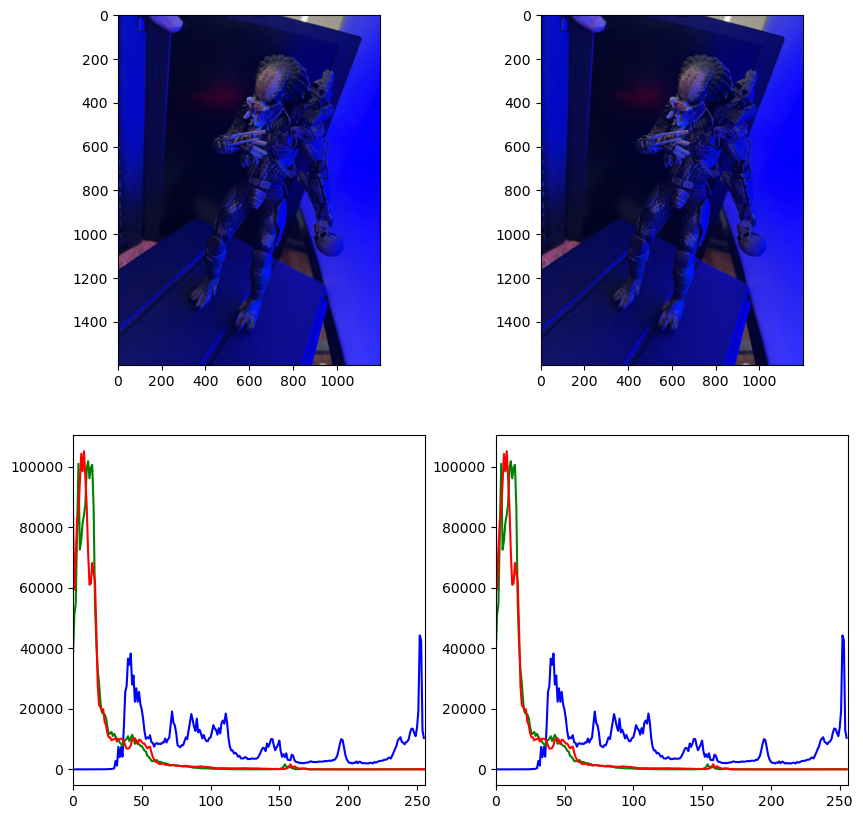

./white_patch/wp_green.png
Img-Bmax:155 Img-Gmax:252 Img-Rmax:126
WP-Bmax:255 WP-Gmax:255 WP-Rmax:255


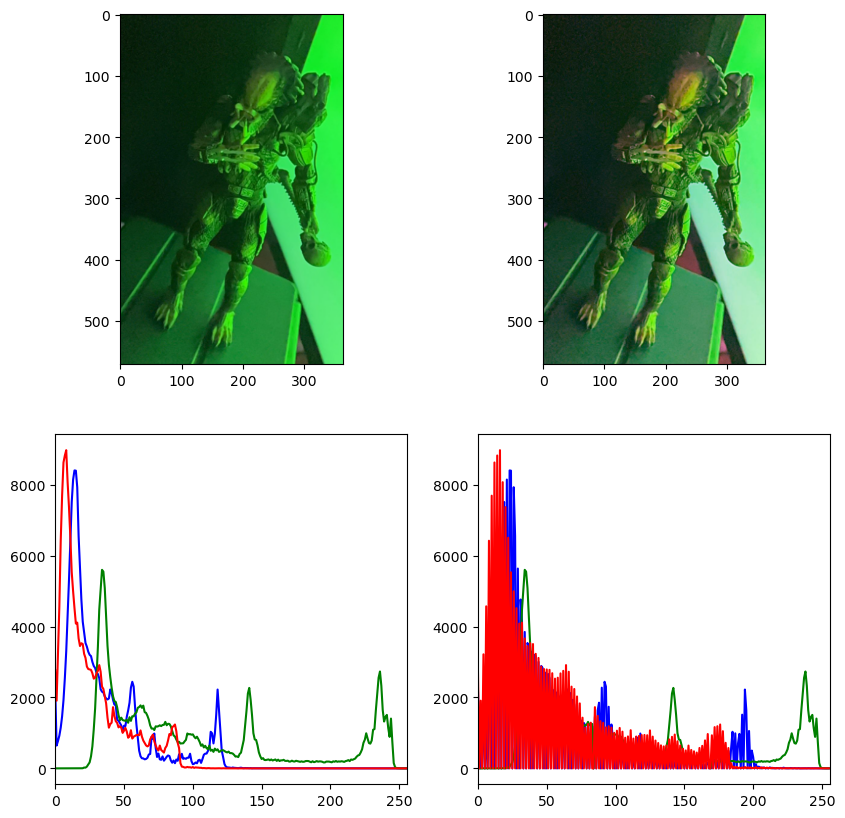

./white_patch/wp_green2.jpg
Img-Bmax:172 Img-Gmax:255 Img-Rmax:170
WP-Bmax:255 WP-Gmax:255 WP-Rmax:255


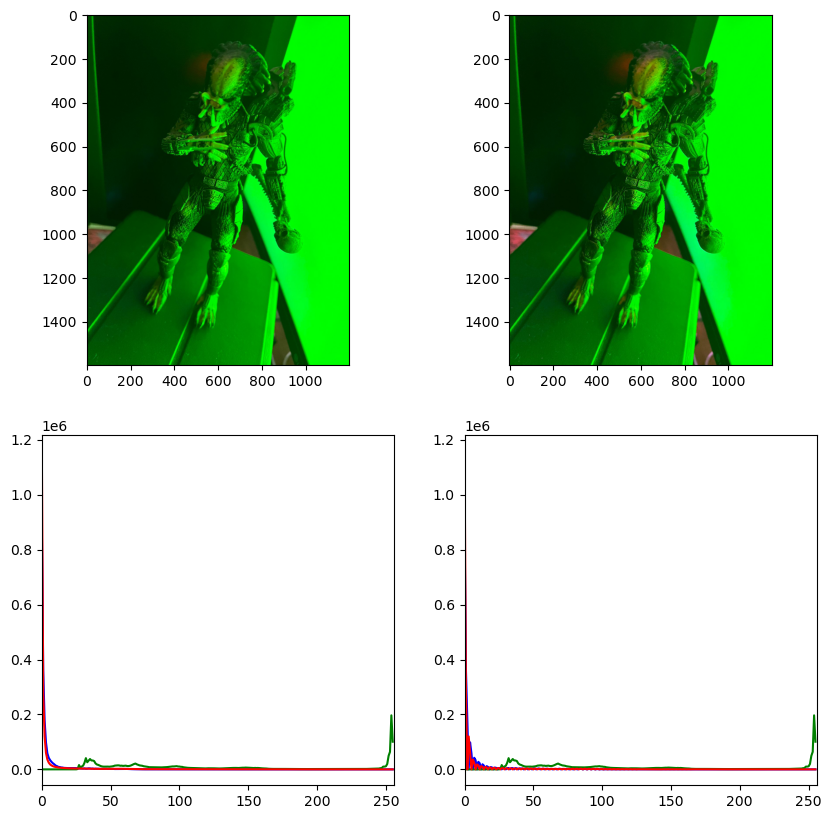

./white_patch/wp_red.png
Img-Bmax:122 Img-Gmax:134 Img-Rmax:255
WP-Bmax:255 WP-Gmax:255 WP-Rmax:255


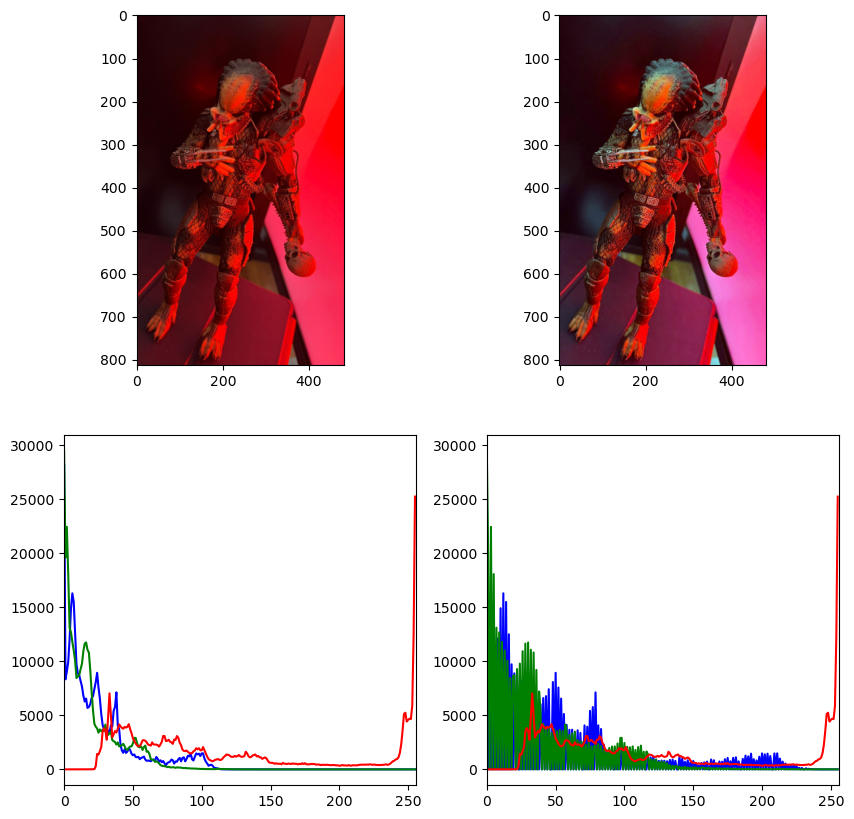

./white_patch/wp_red2.jpg
Img-Bmax:203 Img-Gmax:201 Img-Rmax:255
WP-Bmax:254 WP-Gmax:255 WP-Rmax:255


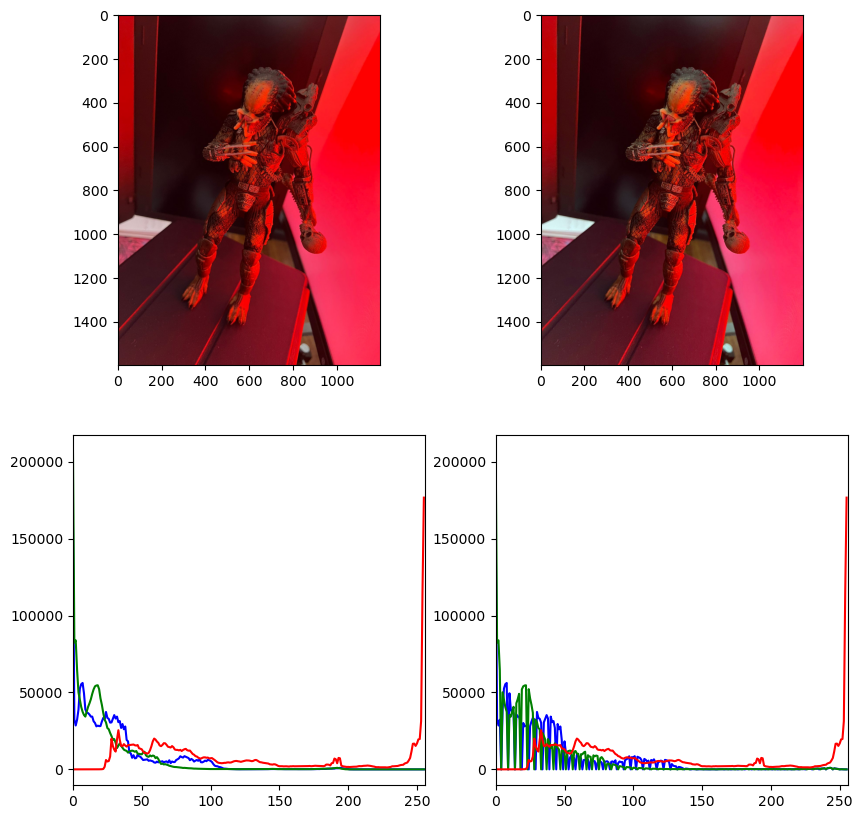

In [15]:
# recorro la lista de imagenes
for imgName in imgListWhitePatch:
    print(imgName)
    # cargo la imagen
    img = cv2.imread(imgName)
    # convierto la imagen a coordenadas cromaticas
    imgWhitePatch = img2whitePatch(img)
    # se muestra la imagen original y la imagen en white-patch con plt una al lado de la otra
    plt.figure(figsize=(10,10))
    plt.subplot(2,2,1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.subplot(2,2,2)
    plt.imshow(cv2.cvtColor(imgWhitePatch, cv2.COLOR_BGR2RGB))
    # se muestran los histogramas de la imagen original y la imagen en white-patch
    plt.subplot(2,2,3)
    histograma(img)
    plt.subplot(2,2,4)
    histograma(imgWhitePatch)
    plt.show()
    


Se puede observar algunas que algunas imágenes no tienen mejoras significativas al aplicar el white-patch.

Se esto se debe a que la imagen tiene uno de los canales saturados por los datos que se observan en el histograma.

Los canales que están saturados en la imagen original no presentan una mejora al aplicar el algoritmo white-patch. Esto se puede observar en los dientes de sierra que se genera en el histograma de cada canal a aplicar la transformación, en los canales que no se aplica estos dientes de sierra no se generan.

Una forma de mejorar esto seria puede ser utilizar un percentil en vez del máximo cuando este esta saturado. Se crea función de muestra con un percentil de 90.

./white_patch/test_blue.png
Img-Bmax:200 Img-Gmax:138 Img-Rmax:165
Img-Bper:159.0 Img-Gper:107.0 Img-Rper:140.0
Img-maxBAjustado:200 Img-maxGAjustado:138 Img-maxRAjustado:165
WP-Bmax:254 WP-Gmax:255 WP-Rmax:255


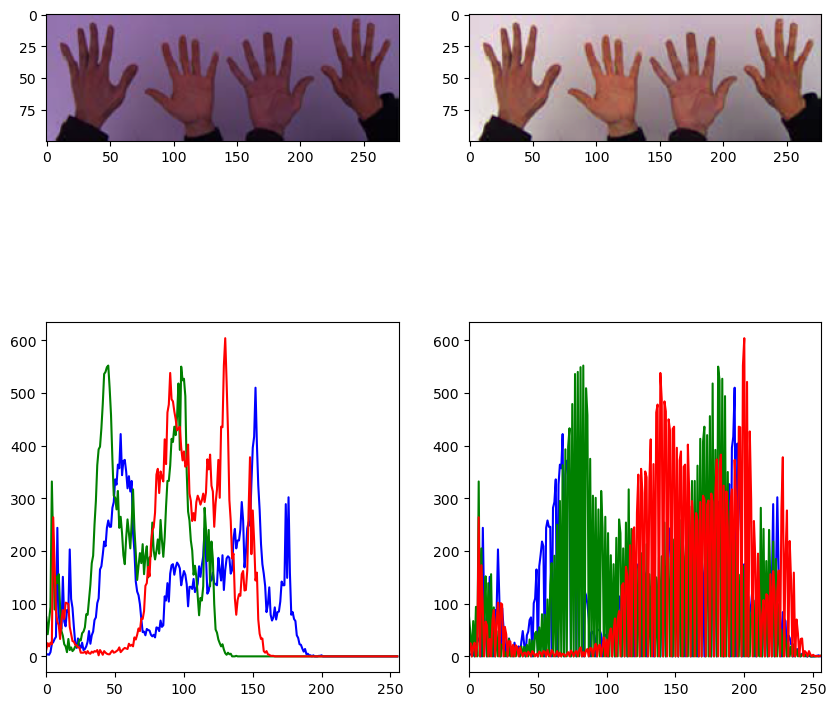

./white_patch/test_green.png
Img-Bmax:171 Img-Gmax:250 Img-Rmax:210
Img-Bper:134.0 Img-Gper:201.0 Img-Rper:176.0
Img-maxBAjustado:171 Img-maxGAjustado:250 Img-maxRAjustado:210
WP-Bmax:255 WP-Gmax:255 WP-Rmax:254


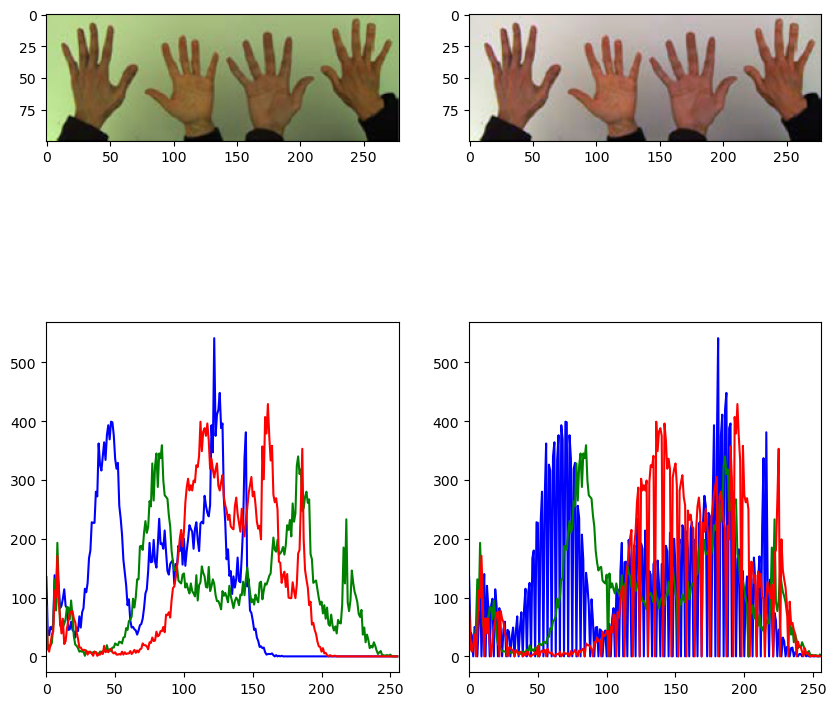

./white_patch/test_red.png
Img-Bmax:175 Img-Gmax:157 Img-Rmax:247
Img-Bper:145.0 Img-Gper:124.0 Img-Rper:209.0
Img-maxBAjustado:175 Img-maxGAjustado:157 Img-maxRAjustado:247
WP-Bmax:255 WP-Gmax:255 WP-Rmax:255


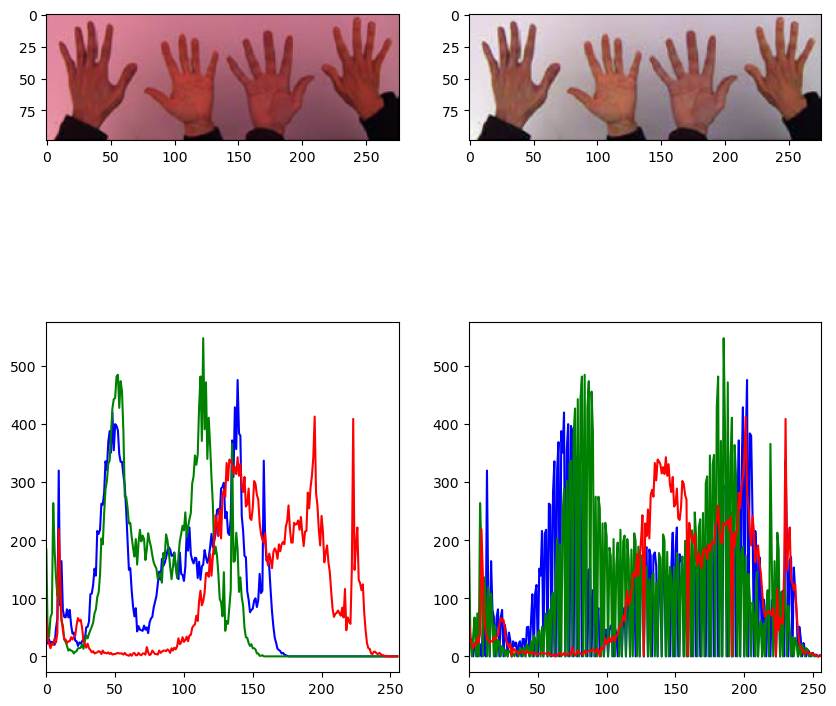

./white_patch/wp_blue.jpg
Img-Bmax:255 Img-Gmax:255 Img-Rmax:255
Img-Bper:246.0 Img-Gper:41.0 Img-Rper:44.0
Img-maxBAjustado:246.0 Img-maxGAjustado:41.0 Img-maxRAjustado:44.0
WP-Bmax:255 WP-Gmax:255 WP-Rmax:255


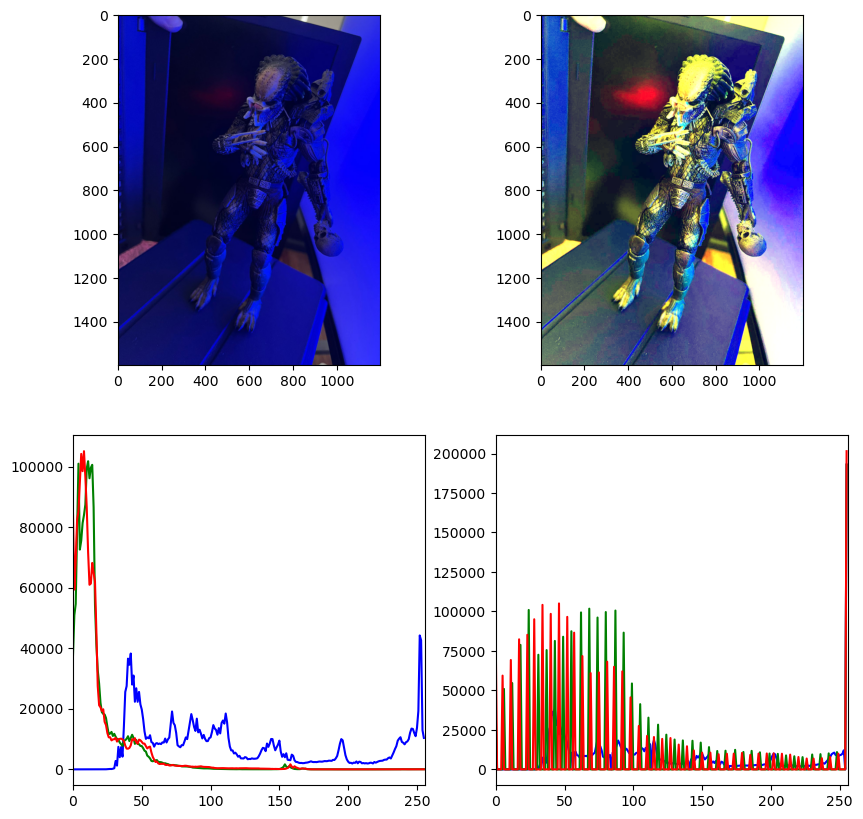

./white_patch/wp_green.png
Img-Bmax:155 Img-Gmax:252 Img-Rmax:126
Img-Bper:80.0 Img-Gper:233.0 Img-Rper:64.0
Img-maxBAjustado:155 Img-maxGAjustado:252 Img-maxRAjustado:126
WP-Bmax:255 WP-Gmax:255 WP-Rmax:255


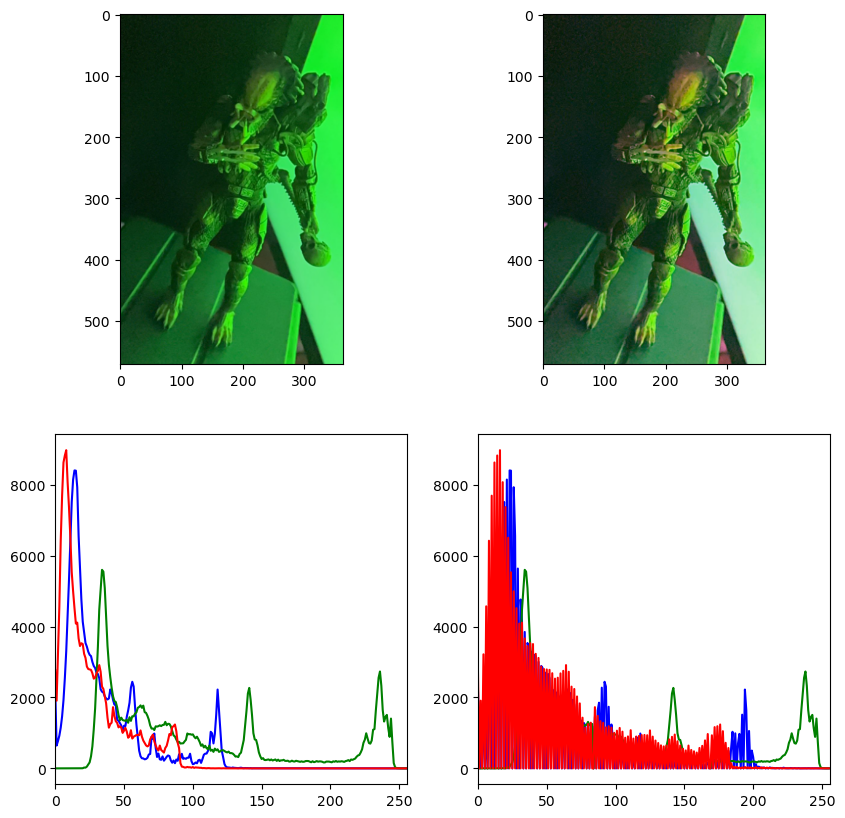

./white_patch/wp_green2.jpg
Img-Bmax:172 Img-Gmax:255 Img-Rmax:170
Img-Bper:10.0 Img-Gper:254.0 Img-Rper:9.0
Img-maxBAjustado:172 Img-maxGAjustado:254.0 Img-maxRAjustado:170
WP-Bmax:255 WP-Gmax:255 WP-Rmax:255


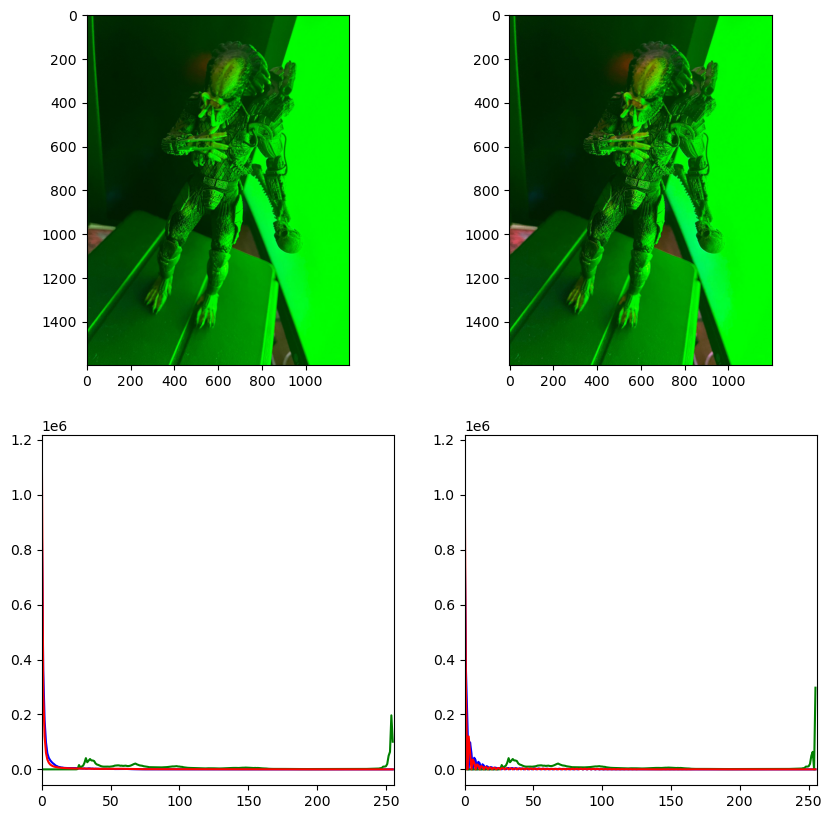

./white_patch/wp_red.png
Img-Bmax:122 Img-Gmax:134 Img-Rmax:255
Img-Bper:65.0 Img-Gper:49.0 Img-Rper:253.0
Img-maxBAjustado:122 Img-maxGAjustado:134 Img-maxRAjustado:253.0
WP-Bmax:255 WP-Gmax:255 WP-Rmax:255


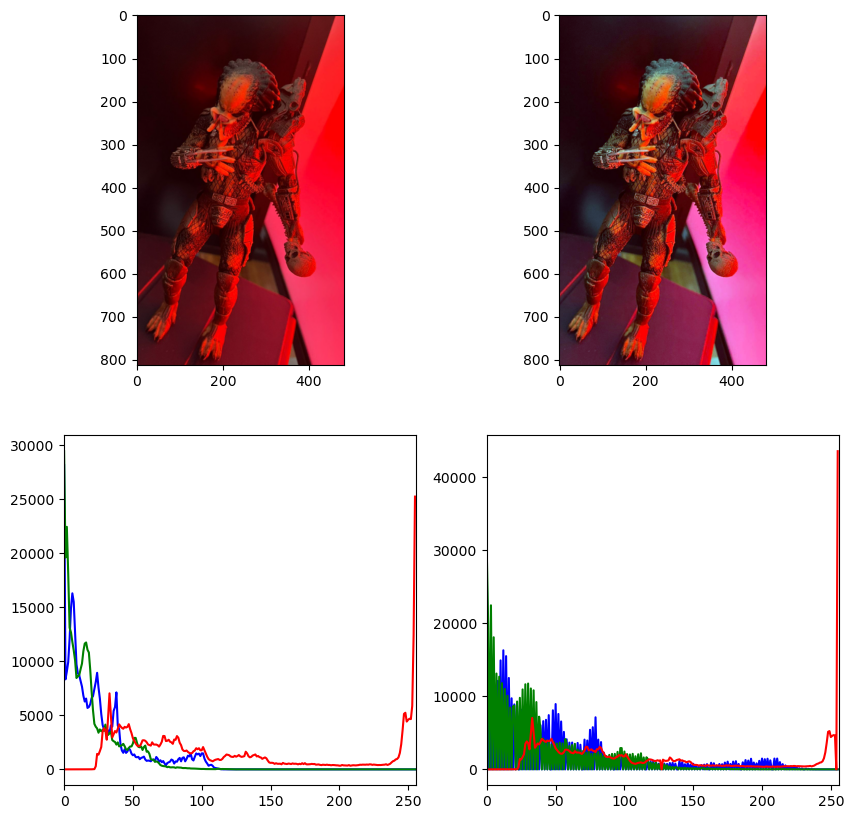

./white_patch/wp_red2.jpg
Img-Bmax:203 Img-Gmax:201 Img-Rmax:255
Img-Bper:77.0 Img-Gper:49.0 Img-Rper:254.0
Img-maxBAjustado:203 Img-maxGAjustado:201 Img-maxRAjustado:254.0
WP-Bmax:254 WP-Gmax:255 WP-Rmax:255


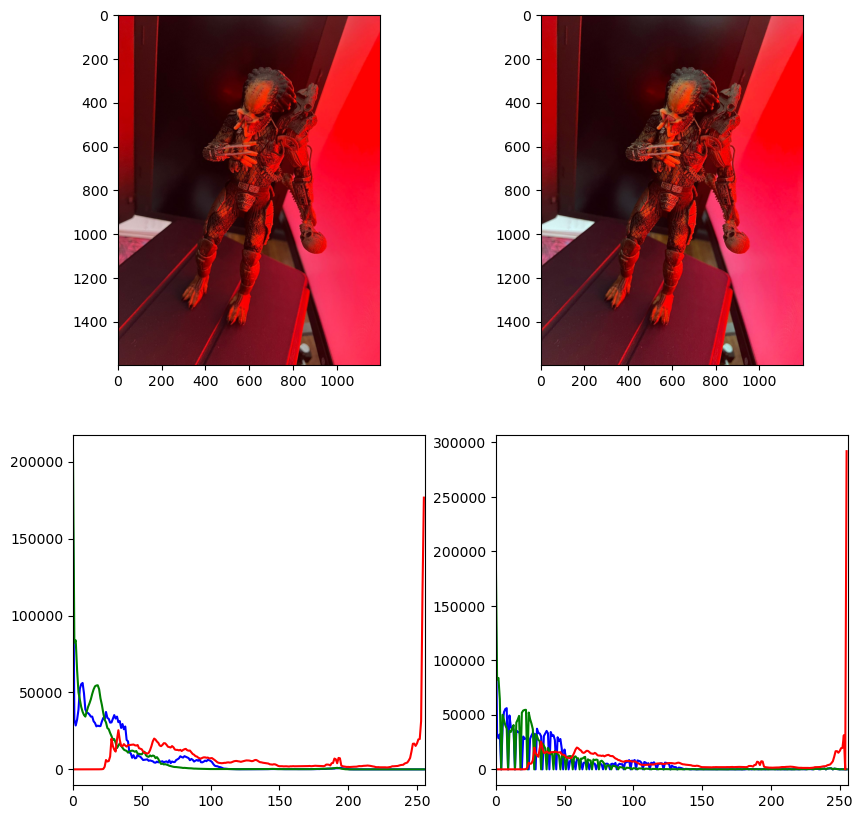

In [175]:
# recorro la lista de imagenes
for imgName in imgListWhitePatch:
    print(imgName)
    # cargo la imagen
    img = cv2.imread(imgName)
    # convierto la imagen a coordenadas cromaticas
    imgWhitePatch = img2whitePatchPercentil(img)
    # se muestra la imagen original y la imagen en white-patch con plt una al lado de la otra
    plt.figure(figsize=(10,10))
    plt.subplot(2,2,1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.subplot(2,2,2)
    plt.imshow(cv2.cvtColor(imgWhitePatch, cv2.COLOR_BGR2RGB))
    # se muestran los histogramas de la imagen original y la imagen en white-patch
    plt.subplot(2,2,3)
    histograma(img)
    plt.subplot(2,2,4)
    histograma(imgWhitePatch)
    plt.show()

# Parte 2

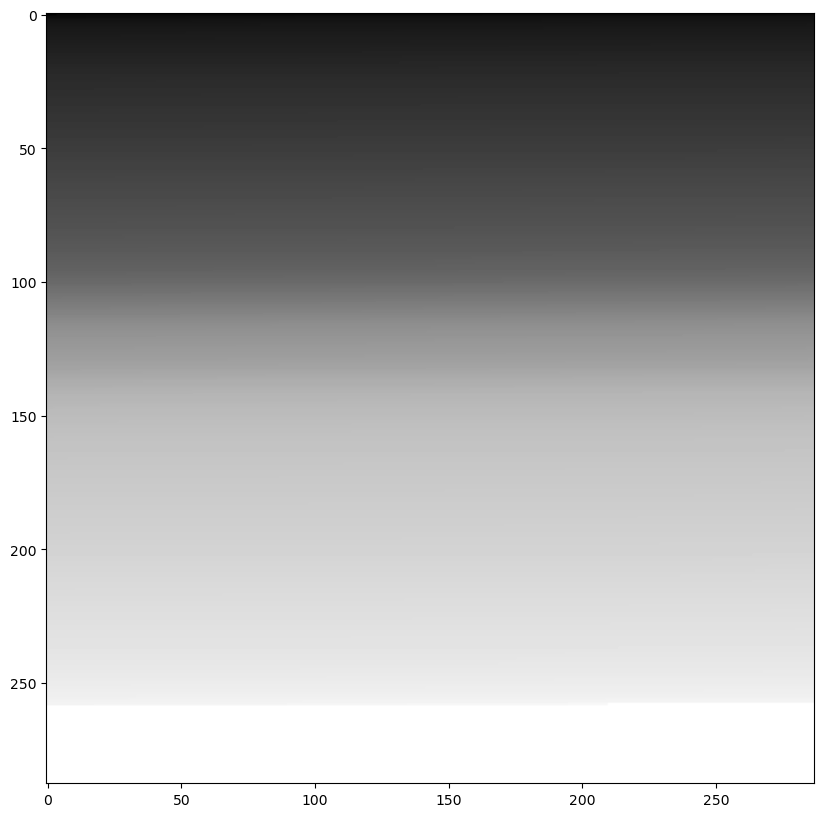

In [20]:
# le la imagen 'img1_tp.png' con OpenCV en escala de grises y la muestra con plt
img1 = cv2.imread('img1_tp.png', cv2.IMREAD_GRAYSCALE)
plt.figure(figsize=(10,10))
plt.imshow(img1, cmap='gray')
plt.show()

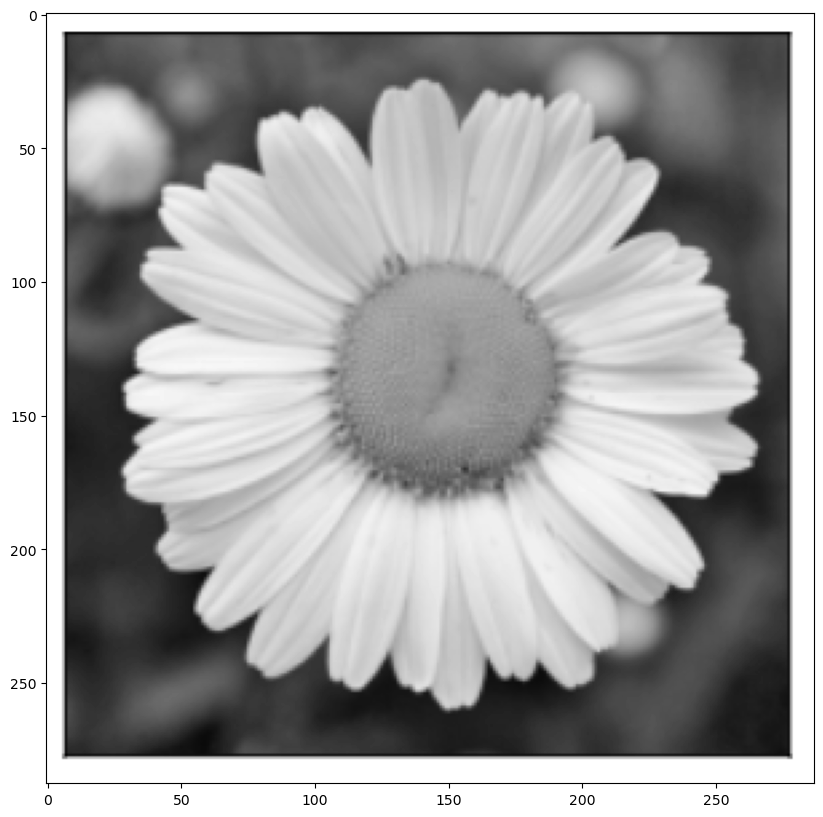

In [21]:
# le la imagen 'img2_tp.png' con OpenCV en escala de grises y la muestra con plt
img2 = cv2.imread('img2_tp.png', cv2.IMREAD_GRAYSCALE)
plt.figure(figsize=(10,10))
plt.imshow(img2, cmap='gray')
plt.show()

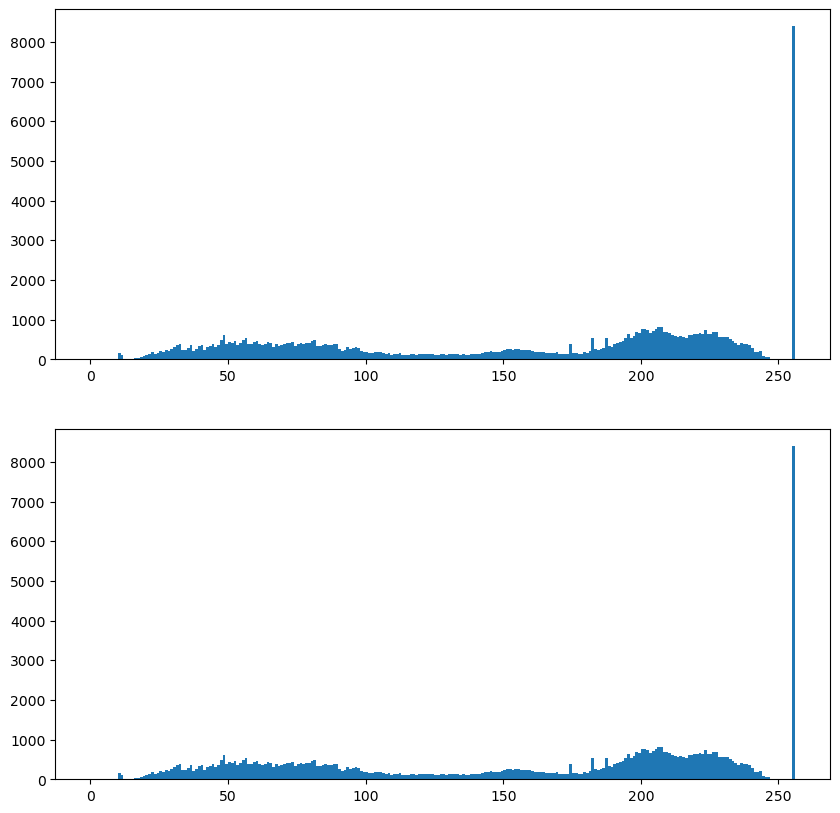

In [24]:
# Comparacion de histogramas de las imagenes 'img1_tp.png' y 'img2_tp.png' con plt
plt.figure(figsize=(10,10))
plt.subplot(2,1,1)
plt.hist(img1.ravel(),256,[0,256])
plt.subplot(2,1,2)
plt.hist(img2.ravel(),256,[0,256])
plt.show()


Las 2 imágenes, a pesar de ser claramente diferentes, tienen el mismo histograma.
Si tuviera que hacer un modelo de clasificación de imágenes, el histograma no me parecería una característica útil para el mismo.

## Analiso segmentacion.png

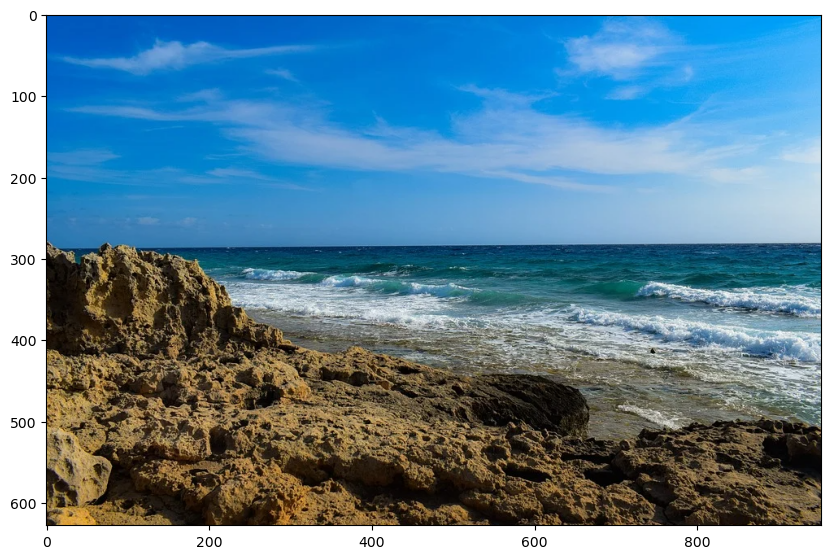

In [5]:
# cargo la imagen 'segmentacion.png' con OpenCV y la muestro con plt
img = cv2.imread('segmentacion.png')
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

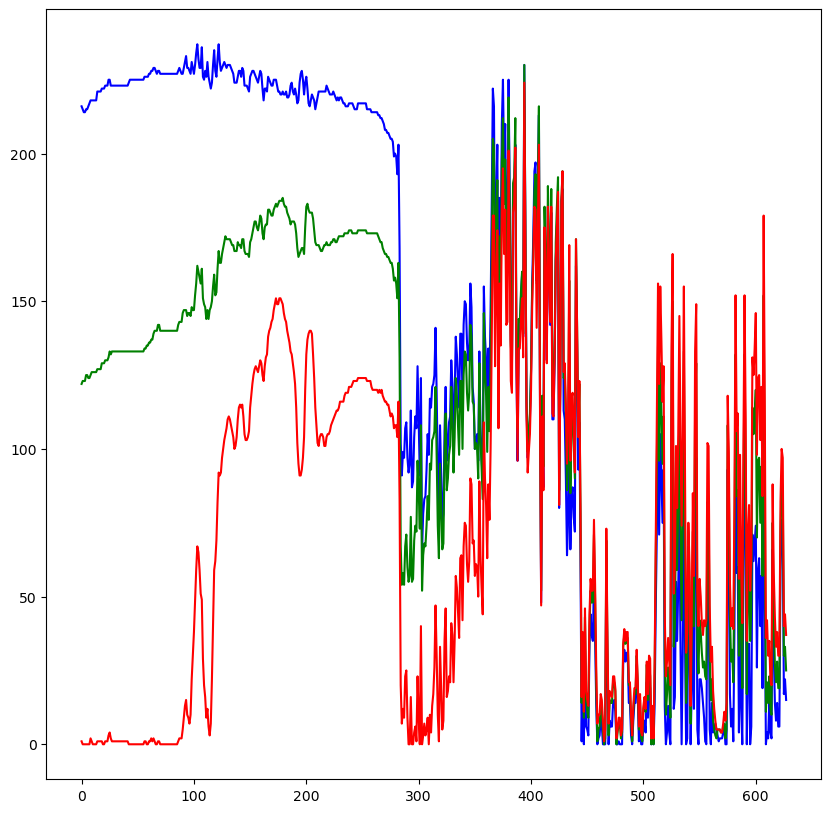

In [77]:
# se realiza un corte de la columna 600 de la imagen
imgCorte = img[:,600,:]
# muestra el primer canal de la columna 600
plt.figure(figsize=(10,10))
plt.plot(imgCorte[:,0], color='b')
plt.plot(imgCorte[:,1], color='g')
plt.plot(imgCorte[:,2], color='r')
plt.show()


Se puede observar que en la zona del cielo (x < 280), el canal 1(azul) tiene un valor mucho mayor que en el resto de las zonas, a excepción de las olas. Esto lo vuelve una buena característica para segmentar.

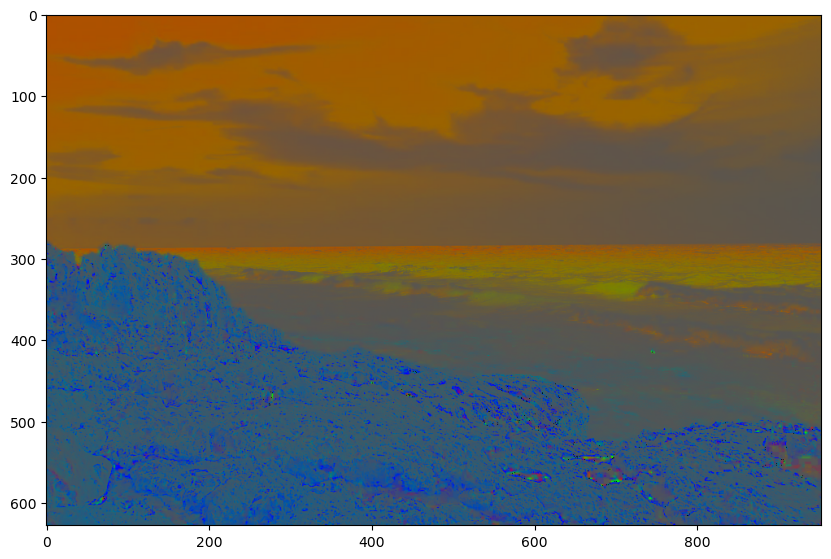

In [7]:
# hago transformacion de la imagen 'segmentacion.png' a coordenadas cromaticas
imgCromatica = img2coordCromatica(img)
# la muestro con plt
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(imgCromatica, cv2.COLOR_BGR2RGB))

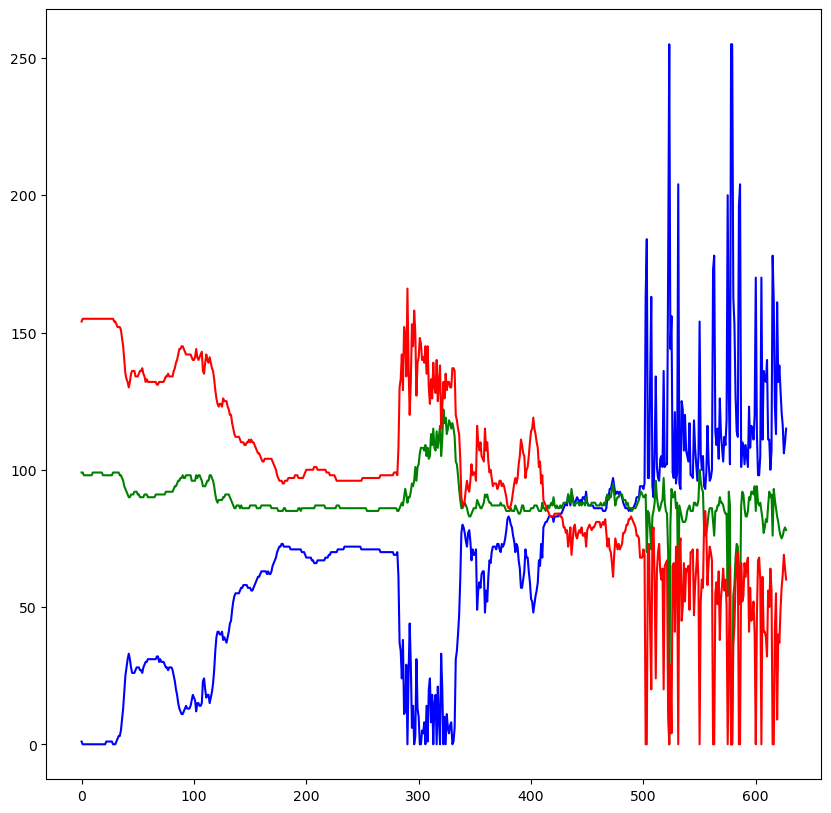

In [91]:
# se realiza un corte de la columna 600 de la imagen
imgCorte = imgCromatica[:,800,:]
# muestra el primer canal de la columna 600
plt.figure(figsize=(10,10))
plt.plot(imgCorte[:,0], color='b')
plt.plot(imgCorte[:,1], color='g')
plt.plot(imgCorte[:,2], color='r')
plt.show()

Se observa como la zona de la tierra (x>500) tiene valores en el canal 1(azul) mayores que las otras zonas, por lo tanto, este es una característica para identificar esta zona.

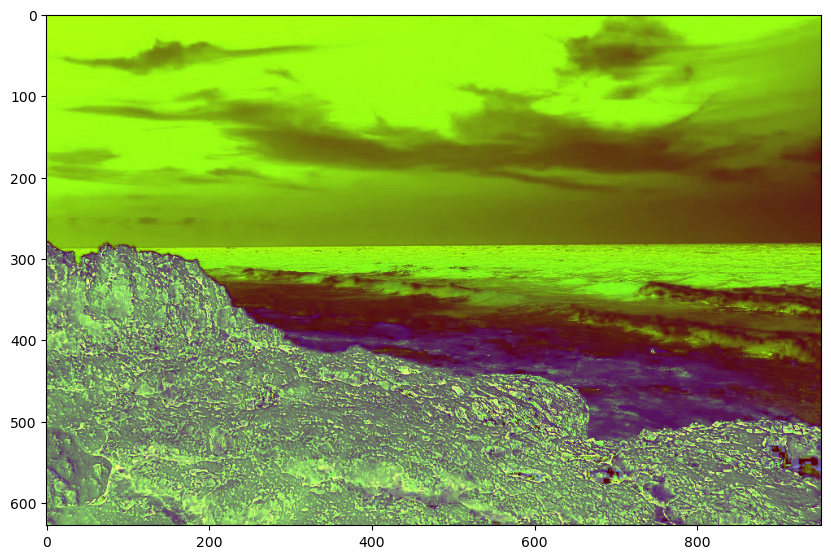

In [115]:
# paso la imagen a hsv
imgHSV = cv2.cvtColor(imgCromatica, cv2.COLOR_BGR2HSV)
# muestro la imagen hsv
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(imgHSV, cv2.COLOR_BGR2RGB))


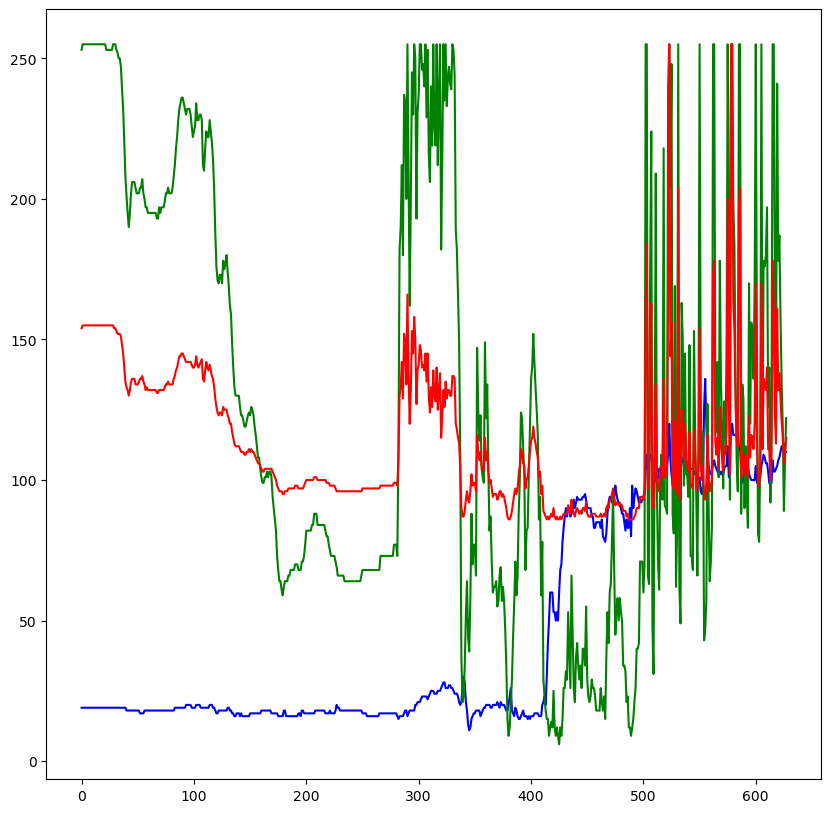

In [116]:
# se realiza un corte de la columna 600 de la imagen
imgCorte = imgHSV[:,800,:]
# muestra el primer canal de la columna 600
plt.figure(figsize=(10,10))
plt.plot(imgCorte[:,0], color='b')
plt.plot(imgCorte[:,1], color='g')
plt.plot(imgCorte[:,2], color='r')
plt.show()

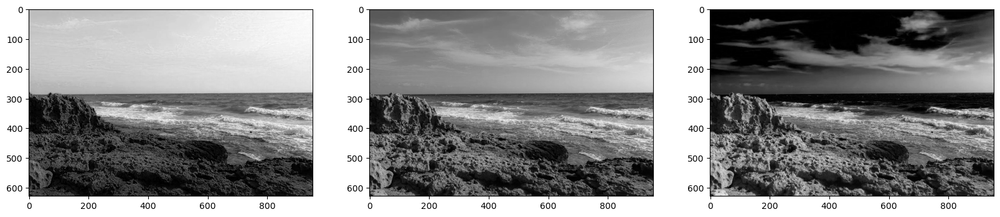

In [132]:
# muesto los canales de la imagen 'segmentacion.png' por separado
plt.figure(figsize=(20,10))
plt.subplot(1,3,1)
plt.imshow(img[:,:,0], cmap='gray')
plt.subplot(1,3,2)
plt.imshow(img[:,:,1], cmap='gray')
plt.subplot(1,3,3)
plt.imshow(img[:,:,2], cmap='gray')
plt.show()

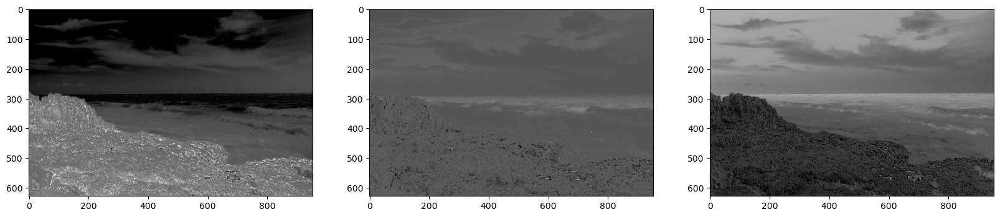

In [133]:
# muesto los canales de la imagen 'segmentacion.png' con transformacion a coordenadas cromaticas por separado
plt.figure(figsize=(20,10))
plt.subplot(1,3,1)
plt.imshow(imgCromatica[:,:,0], cmap='gray')
plt.subplot(1,3,2)
plt.imshow(imgCromatica[:,:,1], cmap='gray')
plt.subplot(1,3,3)
plt.imshow(imgCromatica[:,:,2], cmap='gray')
plt.show()

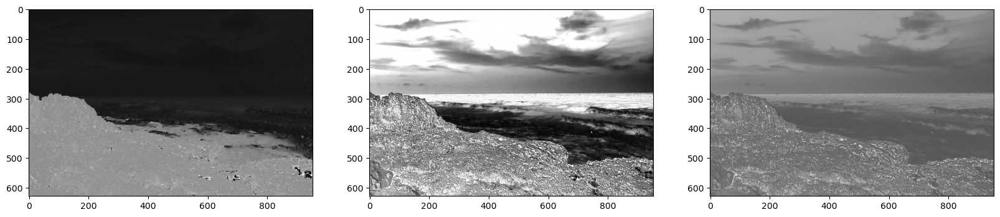

In [134]:
# muesto los canales de la imagen 'segmentacion.png' con transformacion a HSV por separado
plt.figure(figsize=(20,10))
plt.subplot(1,3,1)
plt.imshow(imgHSV[:,:,0], cmap='gray')
plt.subplot(1,3,2)
plt.imshow(imgHSV[:,:,1], cmap='gray')
plt.subplot(1,3,3)
plt.imshow(imgHSV[:,:,2], cmap='gray')
plt.show()

In [144]:
# segmento la imagen 'segmentacion.png' en 3 imagenes Tierra, cielo y agua

# TIERRA
# Por los canales de las imagenes de arriba se puede observar que el en la imagen cromatica el primer canal 
# tiene la tierra con valores altos, y el tercer canal tiene la tierra con valores bajos
imgTierra = img.copy()
imgTierraCromatica = imgCromatica.copy()
maskTierra = np.zeros(imgTierra.shape[:2], np.uint8)
maskTierra[:,:] = 255
maskTierra[ imgTierraCromatica[:,:,0] < 95] = 0
maskTierra[ imgTierraCromatica[:,:,2] > 100] = 0

# CIELO
# Por los canales de las imagenes de arriba se puede observar que el en la imagen cromatica el primer canal
# tiene el cielo con valores bajos, y el tercer canal tiene el cielo con valores bajos
# En la imagen original el primer canal tiene el cielo con valores altos
imgCielo = img.copy()
imgCieloCromatica = imgCromatica.copy()
maskCielo = np.zeros(imgCielo.shape[:2], np.uint8)
maskCielo[:,:] = 255
maskCielo[ imgCieloCromatica[:,:,0] > 90] = 0
# maskCielo[ imgCieloCromatica[:,:,1] < 80] = 0
# maskCielo[ imgCieloCromatica[:,:,1] > 100] = 0
maskCielo[ imgCieloCromatica[:,:,2] < 90] = 0
# maskCielo[ (imgCieloCromatica[:,:,0] < 50) & (imgCieloCromatica[:,:,1] > 95) & (imgCieloCromatica[:,:,2] < 110)] = 0
maskCielo[ imgCielo[:,:,0] < 150 ] = 0 # Ver si no es muy debil a cambio de colores implementarlo asi

# AGUA
# Por los canales de las imagenes de arriba se puede observar que el en la imagen cromatica el tercer canal
# tiene el agua con valores altos, y el segundo canal tiene el agua con valores altos
# En la imagen original el primer canal tiene el agua con valores bajos
imgAgua = img.copy()
imgAguaCromatica = imgCromatica.copy()
maskAgua = np.zeros(imgAgua.shape[:2], np.uint8)
maskAgua[:,:] = 255
# maskAgua[ imgAguaCromatica[:,:,1] < 90] = 0
# maskAgua[ imgAguaCromatica[:,:,2] < 70] = 0
# maskAgua[ imgCielo[:,:,0] > 150 ] = 0 # Ver si no es muy debil a cambio de colores implementarlo asi
# La mejor forma de segmentar el agua haciendo una mascara que no incluya el cielo y la tierra, ya que estos tienen mejores caracteristicas que las indetifiquen
maskAgua[:,:] = maskAgua[:,:] - maskCielo[:,:] - maskTierra[:,:] 
#


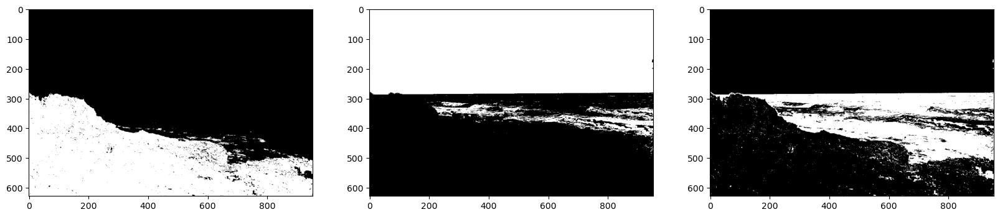

In [145]:
# se muestran las mascaras de las imagenes segmentadas
plt.figure(figsize=(20,10))
plt.subplot(1,3,1)
plt.imshow(maskTierra, cmap='gray')
plt.subplot(1,3,2)
plt.imshow(maskCielo, cmap='gray')
plt.subplot(1,3,3)
plt.imshow(maskAgua, cmap='gray')
plt.show()

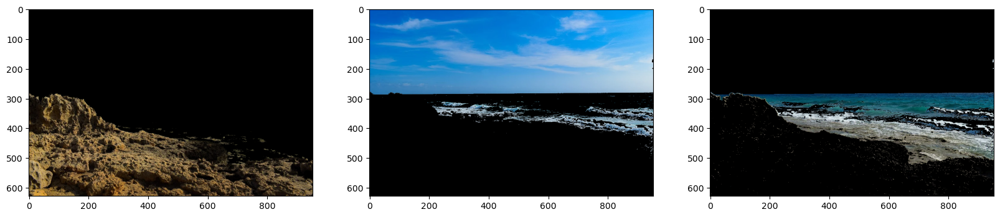

In [146]:
# Se aplican las mascaras a las imagenes originales
imgTierra = cv2.bitwise_and(img, img, mask=maskTierra)
imgCielo = cv2.bitwise_and(img, img, mask=maskCielo)
imgAgua = cv2.bitwise_and(img, img, mask=maskAgua)

# Se muestra las imagenes segmentadas
plt.figure(figsize=(20,10))
plt.subplot(1,3,1)
plt.imshow(cv2.cvtColor(imgTierra, cv2.COLOR_BGR2RGB))
plt.subplot(1,3,2)
plt.imshow(cv2.cvtColor(imgCielo, cv2.COLOR_BGR2RGB))
plt.subplot(1,3,3)
plt.imshow(cv2.cvtColor(imgAgua, cv2.COLOR_BGR2RGB))
plt.show()


Se puede ver en los gráficos de corte que se realizaron en la imagen original y las 2 transformaciones, que los valores en los canales entre el cielo y las olas son muy similares en todos los casos. Esto los vuelve difícil de segmentar entre ellos.


Por otro lado, se puede realizar una buena segmentación de la tierra y el cielo utilizando valores limites en los canales de las imágenes. Este no es el caso para el agua, por lo tanto, la mejor mascara que se puedo generar fue a partir de las máscaras del cielo y la tierra. Para esto se realizó una máscara positiva y se les resto las otras 2 mascaras.